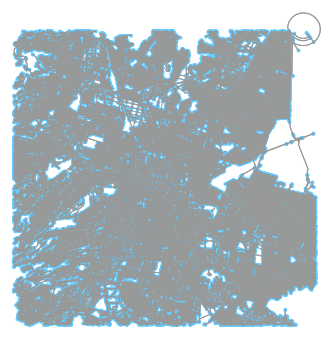

In [16]:
import osmnx as ox
%matplotlib inline
# Mexico city is a node.
G = ox.graph_from_address('Mexico City, Mexico', network_type='drive', distance = 15000, distance_type="bbox") 
fig, ax = ox.plot_graph(ox.project_graph(G))

In [17]:
# calculate Extended stats without the heavier metrics.
extended_stats = ox.extended_stats(G, ecc=False, bc=False, cc=False)

G_projected = ox.project_graph(G)
max_node, max_bc = max(extended_stats['pagerank'].items(), key=lambda x: x[1:5])
max_node, max_bc

(344807167, 3.4894077267400616e-05)

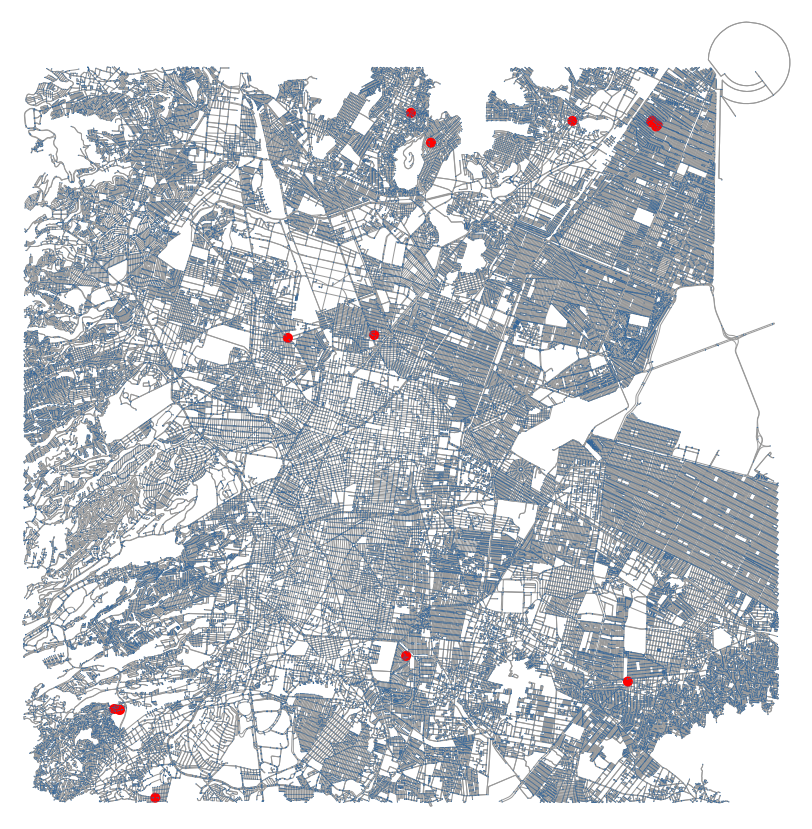

In [46]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (9, 9) # (w, h)

# Biggest degrees in mexico
bc = extended_stats['degree_centrality']
max_list = sorted(bc, key=bc.get, reverse=True)[:15]

nc = ['r' if node in max_list else '#336699' for node in G_projected.nodes()]
ns = [100 if node in max_list else 1 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2, fig_height=15, fig_width=None)

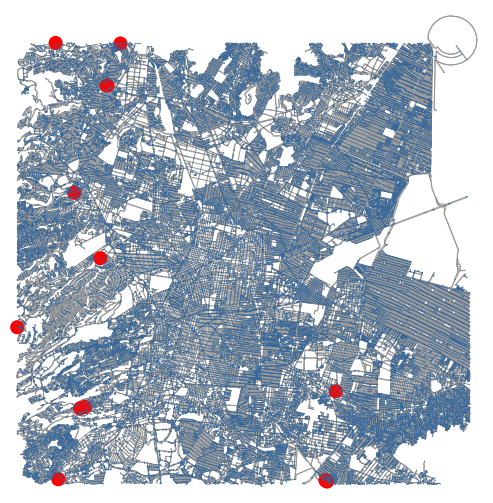

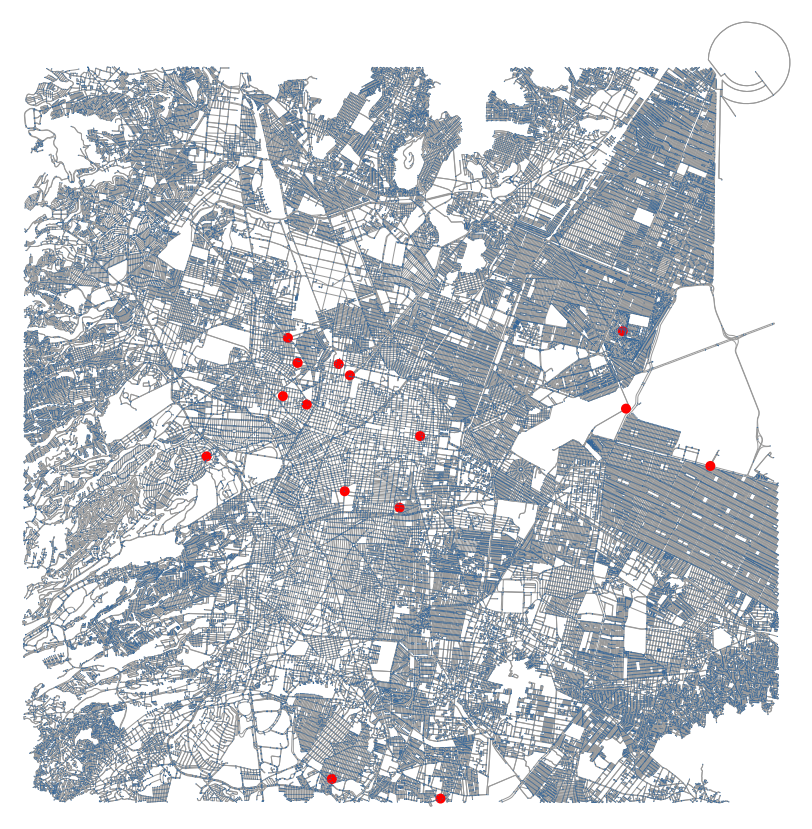

In [47]:
# Figures for clustering coefficient and pagerank
bc = extended_stats['clustering_coefficient']
max_list_clust = sorted(bc, key=bc.get, reverse=True)[:15]

nc = ['r' if node in max_list_clust else '#336699' for node in G_projected.nodes()]
ns = [200 if node in max_list_clust else 1 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2, fig_height=9)

bc = extended_stats['pagerank']
max_list_pagerank = sorted(bc, key=bc.get, reverse=True)[:15]

nc = ['r' if node in max_list_pagerank else '#336699' for node in G_projected.nodes()]
ns = [100 if node in max_list_pagerank else 1 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2, fig_height=15)

In [40]:
print(max_list)
print(max_list_clust)
print(max_list_pagerank)

[300626406, 5849850870, 5437140024, 391683164, 391683165, 391683176, 391683181, 485536114, 2343355410, 262725615, 386245103, 5477356748, 5477356750, 5477356756, 6146348530]
[578816370, 2335445815, 5344863135, 808465890, 1132738946, 2339388673, 2339388676, 5749883630, 5749883631, 5749883635, 5749883636, 4545610793, 3338444051, 1653906757, 1653906789]
[344807167, 274182733, 2265846724, 270281690, 380231739, 1383642058, 5859506945, 372949780, 666075612, 5849850870, 302755091, 388504197, 3396214518, 269996681, 1798337705]


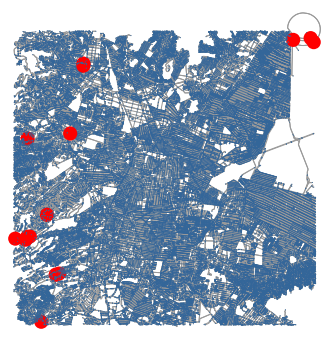

In [33]:
bc = extended_stats['clustering_coefficient_weighted']
max_list_clust = sorted(bc, key=bc.get, reverse=True)[:15]

nc = ['r' if node in max_list_clust else '#336699' for node in G_projected.nodes()]
ns = [200 if node in max_list_clust else 1 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2)

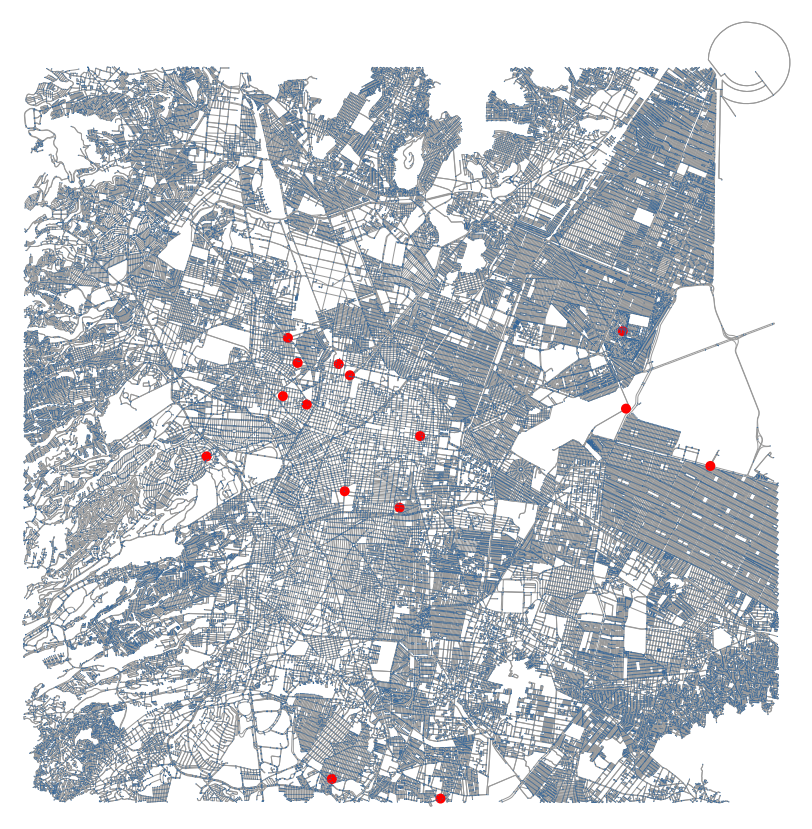

In [50]:
max_list.sort()
max_list
max_list_clust.sort()
max_list_clust

bc = extended_stats['pagerank']
max_list_pagerank = sorted(bc, key=bc.get, reverse=True)[:15]

nc = ['r' if node in max_list_pagerank else '#336699' for node in G_projected.nodes()]
ns = [100 if node in max_list_pagerank else 1 for node in G_projected.nodes()]
fig, ax = ox.plot_graph(G_projected, node_size=ns, node_color=nc, node_zorder=2, fig_height=15, dpi=500)

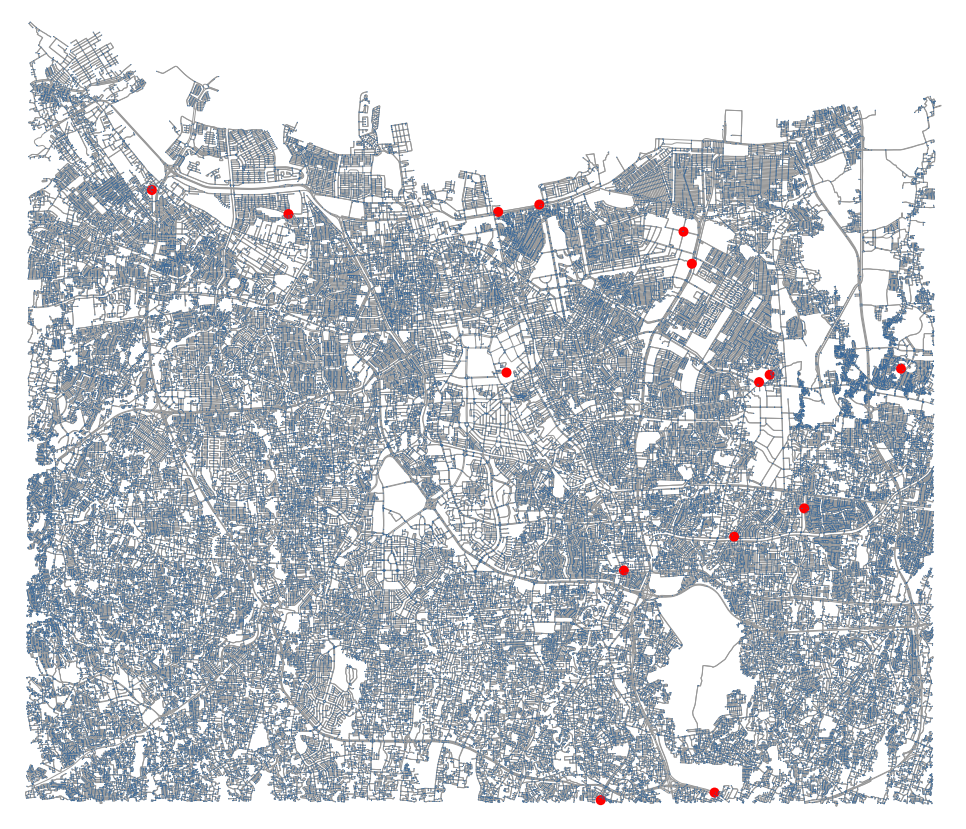

In [52]:
# Jakarta, pagerank
jak = ox.graph_from_point((-6.1753942, 106.8271830), network_type='drive', distance = 15000, distance_type="bbox")
extended_stats_jak = ox.extended_stats(jak, ecc=False, bc=False, cc=False)

jakproj = ox.project_graph(jak)

bc_jak = extended_stats_jak['pagerank']
max_list_pagerank_jak = sorted(bc_jak, key=bc_jak.get, reverse=True)[:15]

nc_jak = ['r' if node in max_list_pagerank_jak else '#336699' for node in jakproj.nodes()]
ns_jak = [100 if node in max_list_pagerank_jak else 1 for node in jakproj.nodes()]
fig, ax = ox.plot_graph(jakproj, node_size=ns_jak, node_color=nc_jak, node_zorder=2, fig_height=15, dpi=800)

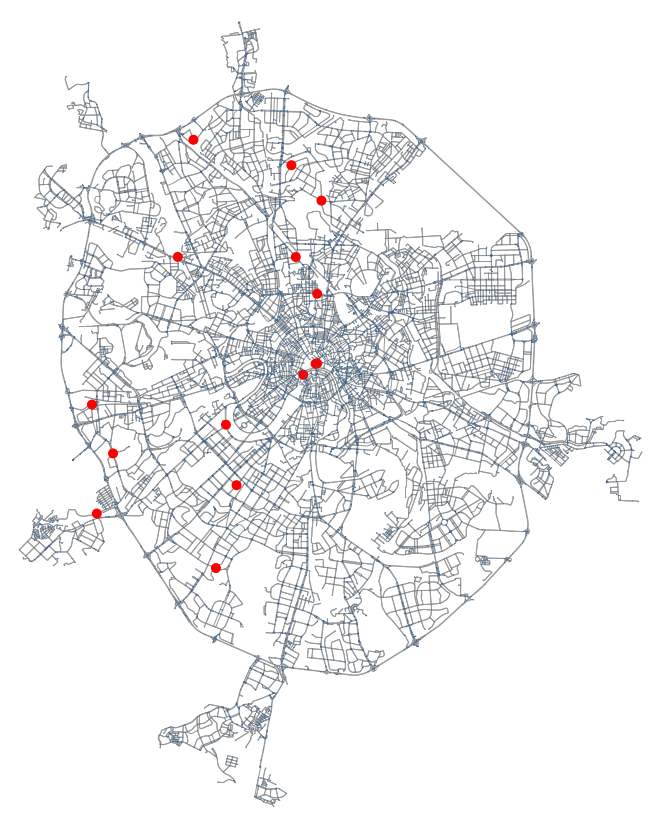

In [8]:
# Moscow betweenness
import osmnx as ox
ms = ox.graph_from_place("Moscow, Russia", network_type='drive')
extended_stats_ms = ox.extended_stats(ms, ecc=False, bc=True, cc=False)

msproj = ox.project_graph(ms)

degs = extended_stats_ms['degree_centrality']
prs = extended_stats_ms['pagerank']
bc = extended_stats_ms['betweenness_centrality']

d = {}
for k in degs.keys():
    d[k] = degs[k] + prs[k] + bc[k]


max_list_pagerank_ms = sorted(d, key=d.get, reverse=True)[:15]

nc_ms = ['r' if node in max_list_pagerank_ms else '#336699' for node in msproj.nodes()]
ns_ms = [100 if node in max_list_pagerank_ms else 1 for node in msproj.nodes()]
fig, ax = ox.plot_graph(msproj, node_size=ns_ms, node_color=nc_ms, node_zorder=2, fig_height=15, dpi=800)

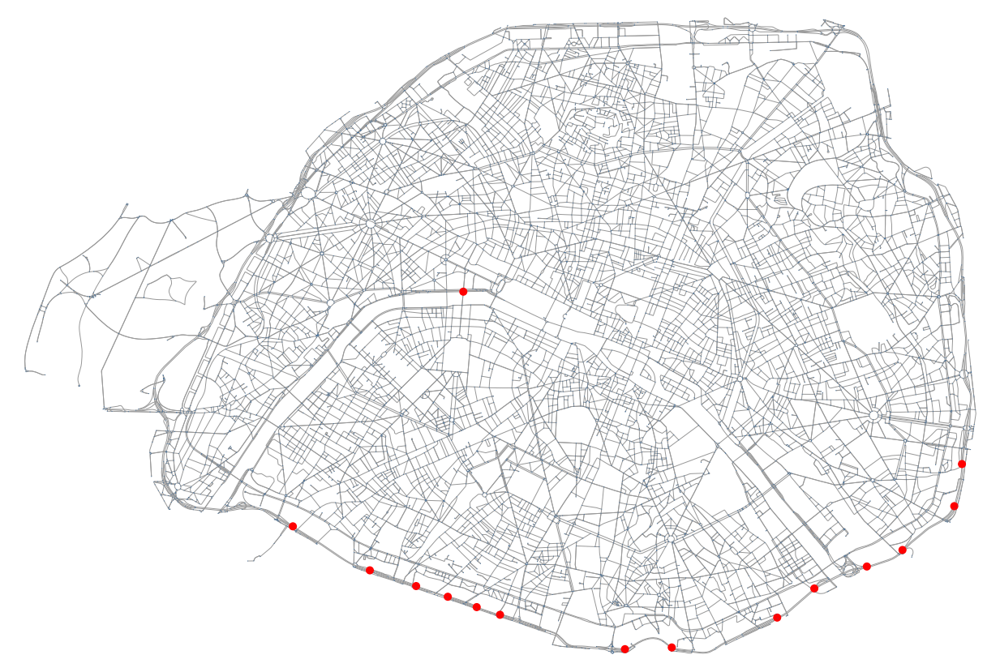

In [27]:
# Graph for paris
import osmnx as ox
paris = ox.graph_from_place("paris", network_type='drive')
extended_stats_paris = ox.extended_stats(paris, ecc=False, bc=True, cc=False)

parisproj = ox.project_graph(paris)

degs = extended_stats_paris['degree_centrality']
prs = extended_stats_paris['pagerank']
bc = extended_stats_paris['betweenness_centrality']

d = {}
for k in degs.keys():
    d[k] = degs[k] + prs[k] + bc[k]


max_list_pagerank_paris = sorted(d, key=d.get, reverse=True)[:15]

nc_paris = ['r' if node in max_list_pagerank_paris else '#336699' for node in parisproj.nodes()]
ns_paris = [100 if node in max_list_pagerank_paris else 1 for node in parisproj.nodes()]
fig, ax = ox.plot_graph(parisproj, node_size=ns_paris, node_color=nc_paris, node_zorder=2, fig_height=15, dpi=800)